# csgy6613-project

Project work for CS-GY-6613 Spring 2024: Artificial Intelligence

David Hauss: dh3382 \
Andres Zarta: aza219

# MILESTONE 2

Replicating SAM implementation for satellite imagery

In [1]:
%pip install segment-geospatial leafmap localtileserver

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 27.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 85.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.0/96.0 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 73.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 104.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 100.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.1/263.1 kB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

## Creating Interactive Satelitte Map of NYU Tandon and Surrounding Downtown Brooklyn Area


In [43]:
m = leafmap.Map(center=[40.694232, -73.985656], zoom=17, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[40.694232, -73.985656], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

From here we can navigate anywhere else in the map and using the left-side tools create a bounding box around our desired area.

In [45]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    # Default bounding box for NYU Tandon and Surroundings
    bbox = [-73.9885, 40.6899, -73.9811, 40.696]

## Download a sample image

In [40]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=17, source="Satellite", overwrite=True)

Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to satellite.tif


In [41]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=12618615.0, center=[40.69333752143067, -73.98675084114076], controls=(ZoomControl(options=['positio…

## Initialize SAM class

The model will to downloaded to the working directory unless otherwise specified.

In [7]:
#out_dir = os.path.join(os. path. expanduser("~"),"Downloads")
#checkpoint = os.path.join(out_dir, "sam_vit_h_4b8939.pth")

sam = SamGeo(
    model_type="vit_h",
    #checkpoint=checkpoint,
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:17<00:00, 150MB/s]


In [8]:
sam.generate(image, output="masks.tif", foreground=True, unique=True)

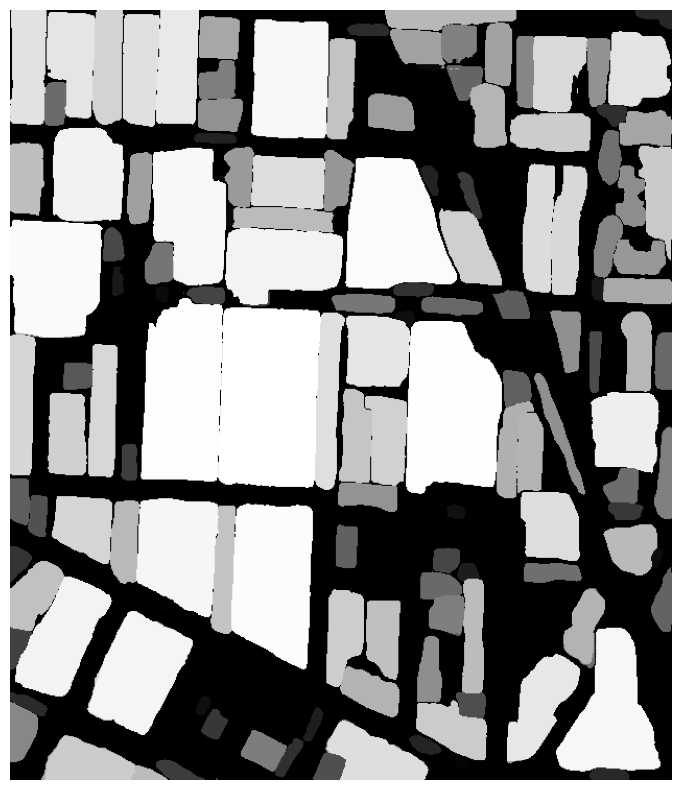

In [9]:
sam.show_masks(cmap="binary_r")

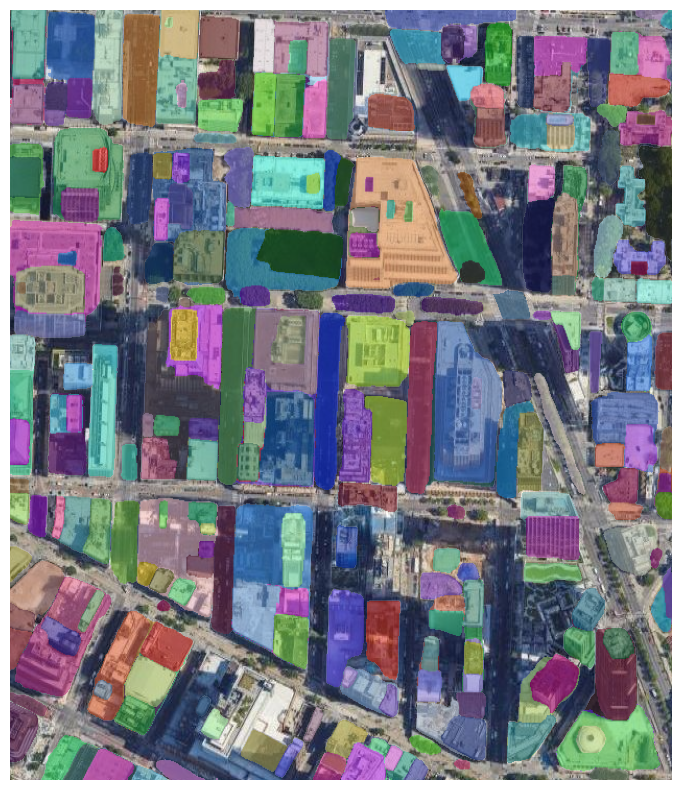

In [18]:
sam.show_anns(axis="off", alpha=0.5, output="annotations.tif")


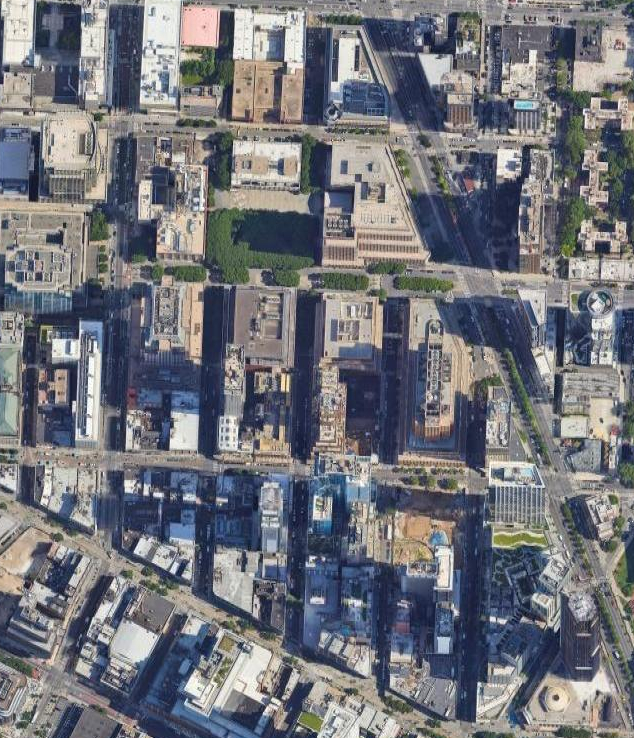
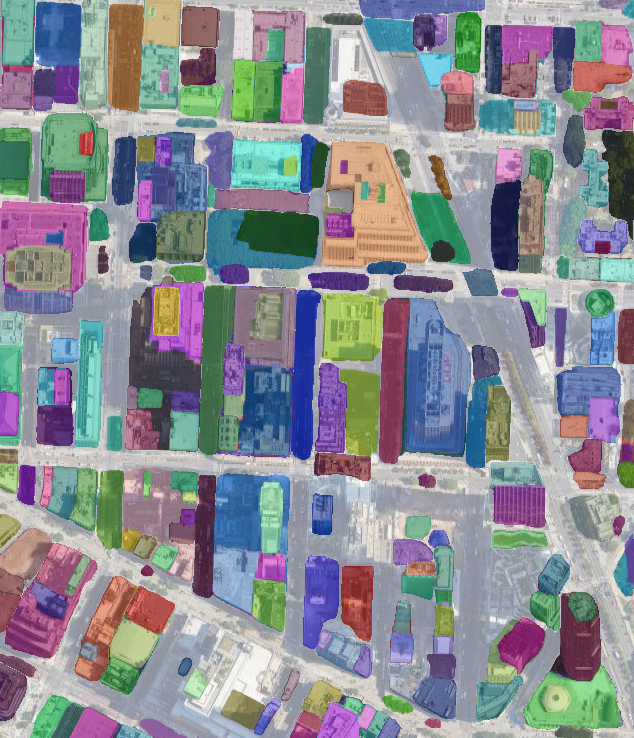

In [19]:
leafmap.image_comparison(
    "satellite.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

In [21]:
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=12618656.0, center=[40.693, -73.9851], controls=(ZoomControl(options=['position', 'zoom_in_text', '…

In [24]:
sam.tiff_to_vector("masks.tif", "masks.gpkg")

## Automatic mask generation options

Using tunable parameters in automatic mask generation

In [26]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [27]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=sam_kwargs,
)

In [28]:
sam.generate(image, output="masks2.tif", foreground=True)

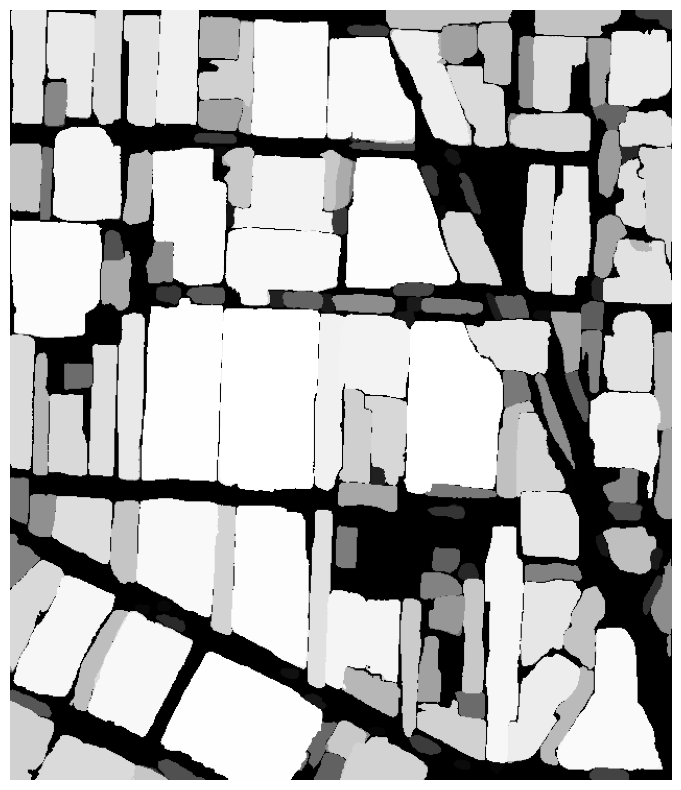

In [29]:
sam.show_masks(cmap="binary_r")

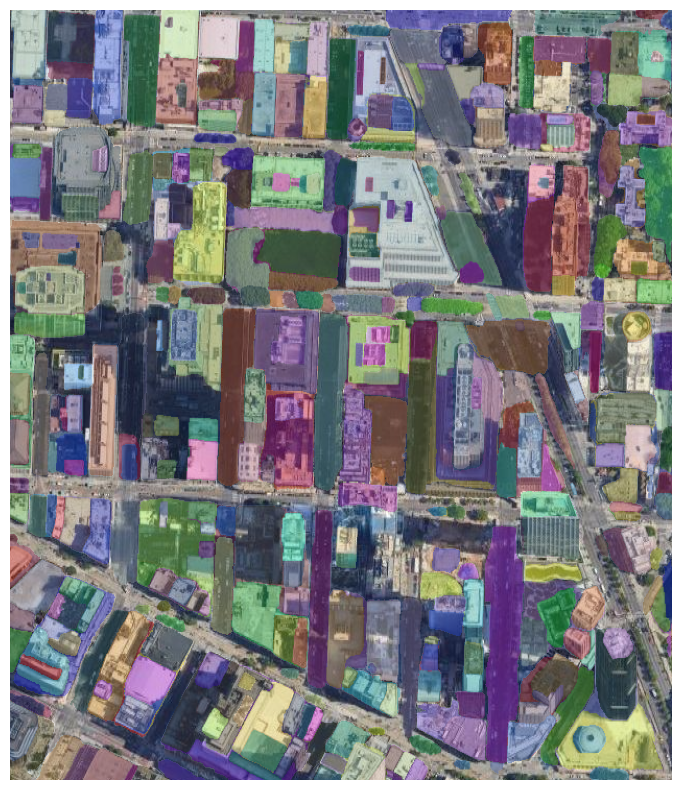

In [33]:
sam.show_anns(axis="off", opacity=0.5, output="annotations2.tif")


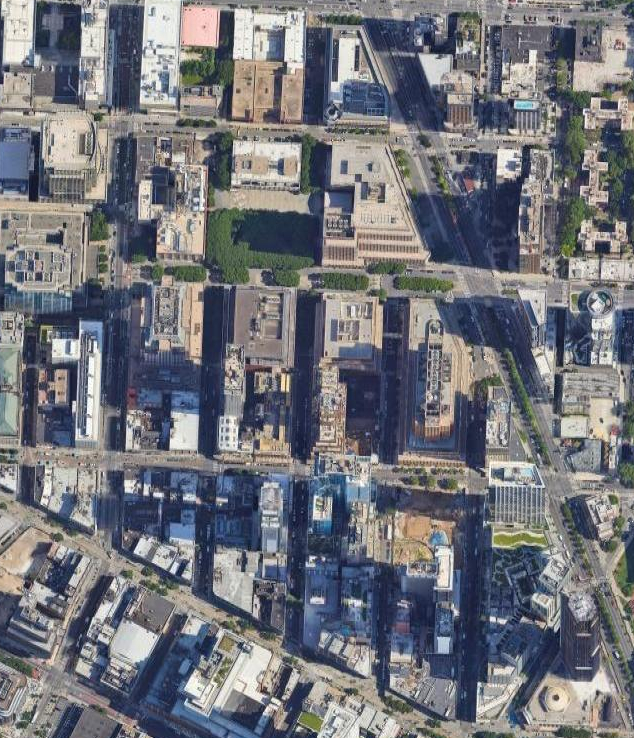
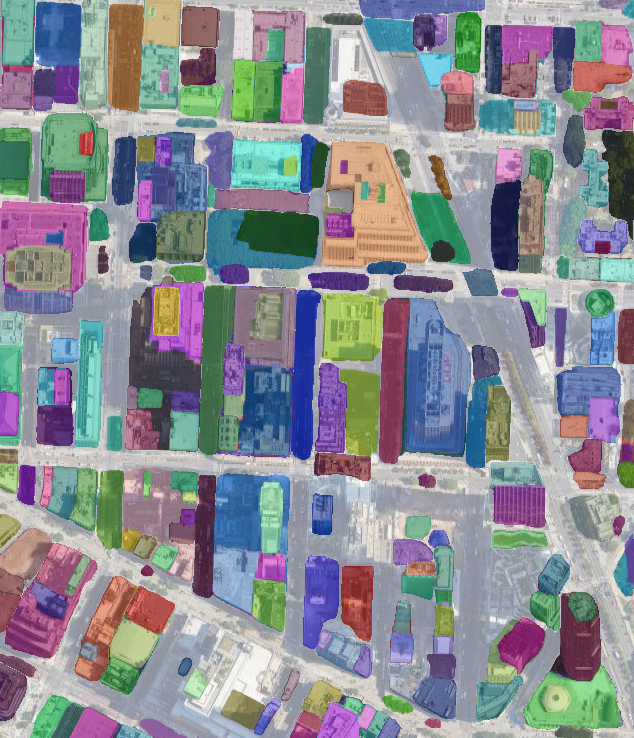

In [34]:
leafmap.image_comparison(
    image,
    "annotations.tif",
    label1="Image",
    label2="Image Segmentation",
)

In [32]:
overlay_images(image, "annotations2.tif", backend="TkAgg")

The TkAgg backend is not supported in Google Colab. The overlay_images function will not work on Colab.
